# Introduction
Our dataset consists of six data frames. These frames contain several information about features of real estate properties in Montreal. Datasets can be found here: https://github.com/npow/centris/tree/master/scraper/data. We analyzed every single set separately.

# 1. listings.csv EDA
Listings from [centris.ca](https://www.centris.ca/)

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from pandas_profiling import ProfileReport
from folium.plugins import FastMarkerCluster

In [5]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 10]

In [3]:
listings = pd.read_csv('data/listings.csv')

## 1.1. Overview

In [4]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14667 entries, 0 to 14666
Data columns (total 65 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   __type                14667 non-null  object 
 1   MlsNumber             14667 non-null  int64  
 2   CategoryCode          14667 non-null  object 
 3   Lat                   14667 non-null  float64
 4   Lng                   14667 non-null  float64
 5   Address               14667 non-null  object 
 6   City                  14667 non-null  object 
 7   Quartier              11488 non-null  object 
 8   ShortCity             14667 non-null  object 
 9   PostalCode            14667 non-null  object 
 10  ShortDescription      0 non-null      float64
 11  LongDescription       12922 non-null  object 
 12  PhotoText             14667 non-null  object 
 13  BuyPrice              14667 non-null  object 
 14  BuyPriceDesc          2811 non-null   object 
 15  LocationPrice      

### 1.1.1 Columns description
- `__type` - ?
- `MlsNumber` - probably id,
- `CategoryCode` - 'COP', 'PPR', 'PCI', 'UNI', 'TER', 'FER'
    COP: AP (Apartment), LS (Loft/Studio), MA (Condo/Loft, House) -- Townhouse
    FER: FE (Farm)
    PCI: C (Commercial), I (Industrial), VE (Bulk, block sale)
    PPR: 2X (Duplex), 3X (Triplex), 4X (Quadruplex), 5X (Quintuplex), AU (Revenue Property)
    TER: TE, TR (Land) 
    UNI: ME/MEM (Single family, 2 or more storeys), MM (Single family, mobile home), MPM (Single family, split level), PP (single family, bungalow)
- `Lat` - latitude,
- `Lng` - longitude,
- `Adress`
- `City` - 33 different cities
- `Quartier` - 52 different districts
- `ShortDescription` - column to drop, contains only NULLS
- `LongDescription` - description od the property(in french or in english)
- `BuyPrice` - buy price in dollars
- `BuyPriceDesc` - '+GST/QST': - goods and services tax (GST) and the Québec sales tax (QST),
    '/square foot', ' /square foot +GST/QST'
- `LocationPrice` - maybe additional price for location,
- `LocationPriceDesc` -  /month', ' /year', ' /month +GST/QST',
       ' /year /square foot +GST/QST', ' /year +GST/QST,
- `Category` - type of building, full category name,
- `Construction` - year of construction,
- `OpenHouse` - probably the open hours when you can come to see the house on sale,
- `GenreCode` - ???,
- `CatgCode` - duplicate of column `CategoryCode`,
- `Utilisation` - mostly nan, other categories: 'Residential only', 'Commercial and residential',
       'Industrial and offices', 'Residential and commercial',
       'Commercial and office space', 'Commercial and industrial',
       'Commercial only', 'Commercial or industrial (income)',
       'Multi-family dwelling', 'Offices only', 'Industrial only',
       'Other', 'Retirement home',
       
- `RevenuEffectif` - column to drop, contains only zeros,
- `RevenueBrutPotentiel` - Gross potential income (GPI) refers to the total rental income a property can produce if all units were fully leased and rented at market rents with a zero vacancy rate,
- `WalkScore` -
    | Score  | Description |
    |---|--:|
    | 90–100	Walker's Paradise  | Daily errands do not require a car. |
    | 70–89	Very Walkable | Most errands can be accomplished on foot. |
    | 50–69	Somewhat Walkable | Some errands can be accomplished on foot. |
    | 25–49	Car-Dependent | Most errands require a car. |
    | 0–24	Car-Dependent | Almost all errands require a car. |
- `SuperficieTerrain` - column to drop, contains only zeros,
- `NbPieces` - number of rooms,
- `NbChambers` - number of bedrooms,
- `NbSallesEaux` - number of bathrooms with shower,
- `NbSallesBains` - number of bathrooms with bathtub,
- `NbFoyerPoele` - number of fireplaces,
- `NbEquipements` - column to drop, contains only zeros,
- `NbGarages` - number of garages,
- `NbStationnements` - number of parking lots,
- `NbPiscines` - number  of pools,
- `NbBordEaux` - ???,
- `NbAnimals` - column to drop, contains only zeros,
- `NbCultures` - ???, value 1 for only 1 observation,
- `Langue` - column to drop, contains only nulls

## 1.2. Numeric columns
Columns to drop: `MlsNumber`, `RevenueEffective`, `ShortDescription`, `Langue`, `SuperficieTerrain`, `NbEquipements`, `NbAnimals`, `NbCultures`.
Columns to convert to numeric: `BuyPrice`, `Construction`.

`LocationPrice` probably to drop because contains mainly NaNs.

### 1.2.1. Convert to numeric `BuyPrice` and `Construction`

In [5]:
listings.BuyPrice

0          $187,500
1          $574,900
2          $475,000
3          $545,000
4          $200,000
            ...    
14662      $760,000
14663    $1,295,000
14664    $1,450,000
14665    $2,268,000
14666    $1,950,000
Name: BuyPrice, Length: 14667, dtype: object

In [6]:
listings.BuyPrice = listings.BuyPrice.apply(lambda x: float(x.replace('$', '').replace(',', '')))

In [7]:
listings.Construction

0        Construction 1988
1        Construction 1955
2        Construction 1959
3                      NaN
4        Construction 2011
               ...        
14662                  NaN
14663    Construction 1909
14664    Construction 1989
14665    Construction 1914
14666    Construction 1939
Name: Construction, Length: 14667, dtype: object

In [8]:
listings.Construction[listings.Construction.isna()] = '0'
listings.Construction = listings.Construction.apply(lambda x: int(x.replace('Construction', '')))
listings.Construction

<ipython-input-8-687be94bffd4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings.Construction[listings.Construction.isna()] = '0'


0        1988
1        1955
2        1959
3           0
4        2011
         ... 
14662       0
14663    1909
14664    1989
14665    1914
14666    1939
Name: Construction, Length: 14667, dtype: int64

#### `Construction`
There are some null values. Probably we can fill the missing values with the year of build of the closest building.

In [9]:
def closest_neighbour_construction_year(lat, lng, df):
    df = df.reset_index()
    return df.Construction[np.argmin(np.sqrt(np.square(lat - df.Lat) + np.square(lng - df.Lng)))]

In [10]:
listings.Construction[listings.Construction == 0] = listings[listings.Construction == 0] \
    .apply(lambda row: closest_neighbour_construction_year(row.Lat, row.Lng, listings[listings.Construction != 0]), axis=1)


<ipython-input-10-ec6a3166ee92>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listings.Construction[listings.Construction == 0] = listings[listings.Construction == 0] \


### 1.2.2. Analyse `BuyPrice` 

In [11]:
listings['BuyPriceDesc'].value_counts()

 +GST/QST                 2791
 /square foot +GST/QST      17
 /square foot                3
Name: BuyPriceDesc, dtype: int64

Some of the prices have the QST and GST taxes included. These taxes are linear so the prices can be easily transformed so that they don't include these taxes.

According to [this](https://wowa.ca/calculators/quebec-sales-tax-calculator) website, QST (Quebec Sales Tax) is set at 9.975% and GST (Goods & Services Tax) is set at 5%.

In [12]:
prices_with_taxes = (listings['BuyPriceDesc'] == ' +GST/QST') | (listings['BuyPriceDesc'] == ' /square foot +GST/QST')
listings.loc[prices_with_taxes, 'BuyPrice'] = np.round(listings.loc[prices_with_taxes, 'BuyPrice'] / 1.14975, 2)

Now the information whether the tax is included in the price is redundant thus it can be removed.

In [13]:
listings.loc[listings['BuyPriceDesc'] == ' +GST/QST', 'BuyPriceDesc'] = np.nan
listings.loc[listings['BuyPriceDesc'] == ' /square foot +GST/QST', 'BuyPriceDesc'] = ' /square foot'

##### `BuyPrice` values

In [14]:
listings.describe().BuyPrice

count    1.466700e+04
mean     5.198367e+05
std      5.964159e+05
min      3.130000e+00
25%      2.590000e+05
50%      3.783431e+05
75%      5.599000e+05
max      1.388000e+07
Name: BuyPrice, dtype: float64

In [15]:
upper_price_limit =  3 * 10**6
lower_price_limit = 10 ** 4
print(np.sum((listings.BuyPrice < upper_price_limit) & (lower_price_limit < listings.BuyPrice)))
limited_listings = listings[(listings.BuyPrice < upper_price_limit) & (lower_price_limit < listings.BuyPrice)]

14500


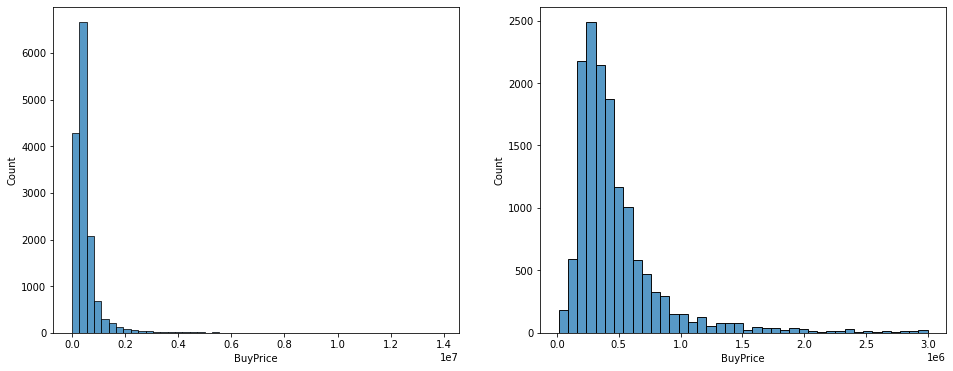

In [16]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
sns.histplot(listings, x='BuyPrice', bins=50)
plt.subplot(1, 2, 2)
sns.histplot(limited_listings, x='BuyPrice', bins=40)
plt.show()

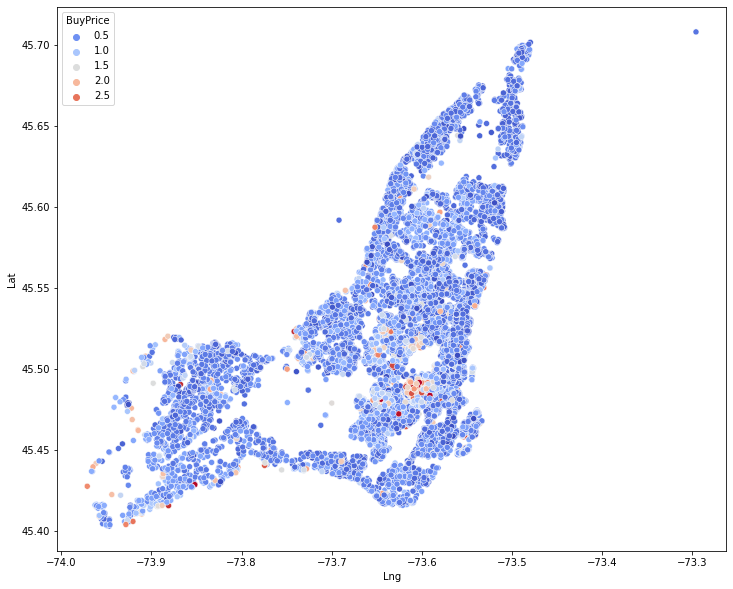

In [17]:
sns.scatterplot(data=limited_listings, x='Lng', y='Lat', hue='BuyPrice', palette=sns.color_palette("coolwarm", as_cmap=True))
plt.show()

### 1.2.3. Correlation matrix

In [18]:
numeric_df = listings.select_dtypes(include=['int', 'float'])
numeric_df = numeric_df.drop(columns=['MlsNumber', 'RevenuEffectif', 
                                                'ShortDescription', 'Langue', 'SuperficieTerrain',
                                                'NbEquipements', 'NbAnimals', 'NbCultures'])
numeric_df

,Lat,Lng,BuyPrice,Construction,RevenuBrutPotentiel,WalkScore,NbPieces,NbChambres,NbSallesEaux,NbSallesBains,NbFoyerPoele,NbGarages,NbStationnements,NbPiscines,NbBordEaux
0,45.556508,-73.633198,187500.00,1988,0,60,5,1,0,1,0,0,1,0,0
1,45.542062,-73.696868,574900.00,1955,26760,75,11,4,0,1,0,0,1,0,0
2,45.573887,-73.649079,475000.00,1959,0,88,0,0,0,0,0,0,1,0,0
3,45.571040,-73.643413,545000.00,1956,22800,84,6,2,0,1,0,0,0,0,0
4,45.533876,-73.672649,200000.00,2011,0,63,6,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14662,45.481498,-73.591471,661013.26,1986,0,85,7,3,1,2,0,0,0,0,0
14663,45.479493,-73.600415,1295000.00,1909,0,97,13,5,2,3,2,2,2,0,0
14664,45.488253,-73.587413,1450000.00,1989,0,99,7,3,1,2,0,2,1,5,0
14665,45.487523,-73.608672,2268000.00,1914,0,46,12,6,1,5,1,2,2,0,0


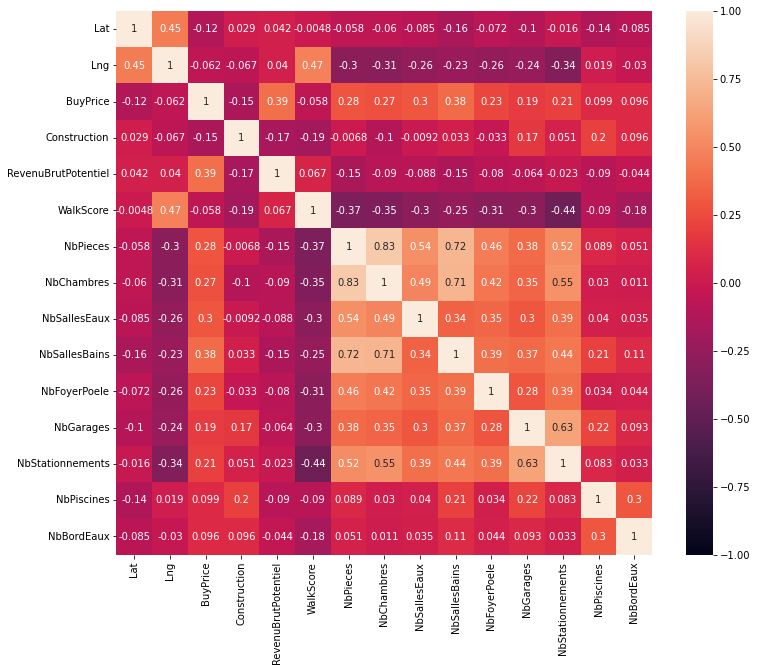

In [19]:
sns.heatmap(numeric_df.corr(), vmin=-1, vmax=1, annot=True)
plt.show()

1. `BuyPrice` is mostly correlated with gross potential income, number of bathrooms, bedrooms and rooms.

### 1.2.4. Histograms

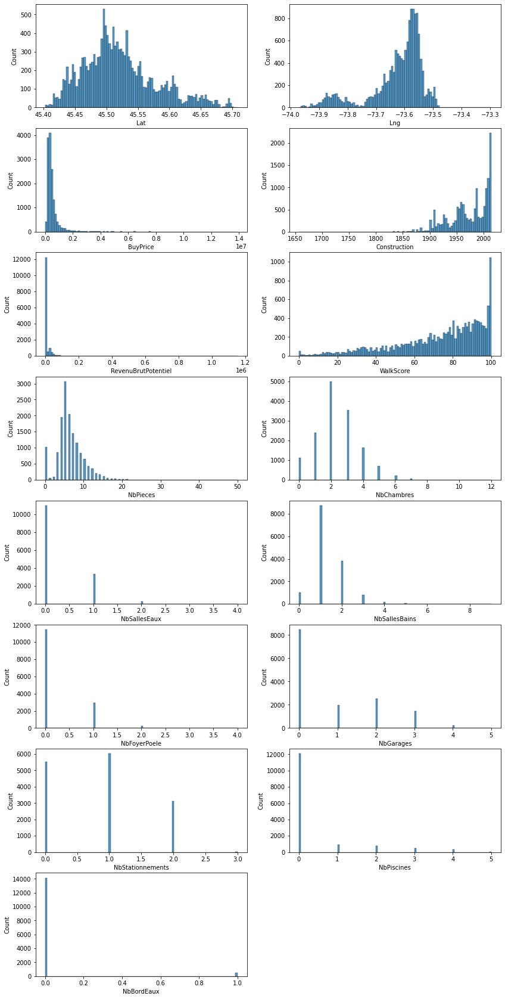

In [20]:
plt.figure(figsize=[14, 30])
for i, column in enumerate(numeric_df.columns):
    plt.subplot(len(numeric_df.columns)//2 + 1, 2, i+1)
    sns.histplot(listings, x=column, bins=100)
plt.show()

## 1.3. Categorical columns
Columns to drop: `CatgCode` (duplicate of `CategoryCode`), `PhotoText` (duplicate of `PageTitle`), `DiffusionWebUrl`, `PhotoUrl`,
       `PhotoPrintingUrl`, `FinancialToolUrl`, `PasserelleUrl`, `CommunityUrl`,
       `GoogleStreetViewUrl`, `WalkScoreUrl`, 
       `ShareThisUrl`, `SummaryUrl`, `PrintingPageUrl`, `GoogleMapAddressLink`
       
Column to convert to boolean: `VisiteVirtuelleUrl`, `OpenHouse`.

Columns to analyse as text data: `PageTitle`, `LongDescription`.

In [21]:
categorical_columns = listings.select_dtypes(include=['object', 'string'])
categorical_columns = categorical_columns.drop(columns=['CatgCode', 'DiffusionWebUrl', 'PhotoUrl',
       'PhotoPrintingUrl', 'FinancialToolUrl', 'PasserelleUrl', 'CommunityUrl',
       'GoogleStreetViewUrl', 'WalkScoreUrl', 'VisiteVirtuelleUrl',
       'ShareThisUrl', 'SummaryUrl', 'PrintingPageUrl', 'PageTitle',
       'GoogleMapAddressLink', 'LongDescription', 'PhotoText', 'PostalCode', '__type', 'Address', 'City', 'LocationPrice',
                                                       'Category'])
categorical_columns.columns

Index(['CategoryCode', 'Quartier', 'ShortCity', 'BuyPriceDesc',
       'LocationPriceDesc', 'OpenHouse', 'GenreCode', 'Utilisation'],
      dtype='object')

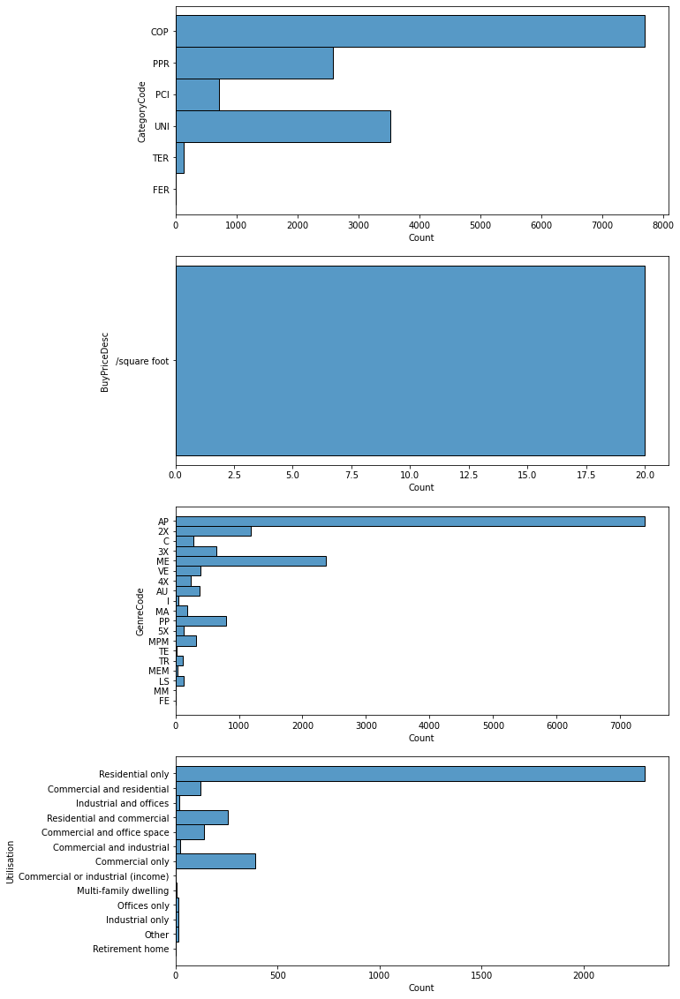

In [22]:
plt.figure(figsize=[10, 20])
categorical_columns_1 = ['CategoryCode', 'BuyPriceDesc', 'GenreCode', 'Utilisation']
for i, column in enumerate(categorical_columns_1):
    plt.subplot(len(categorical_columns_1), 1, i+1)
    sns.histplot(listings, y=column)
plt.show()

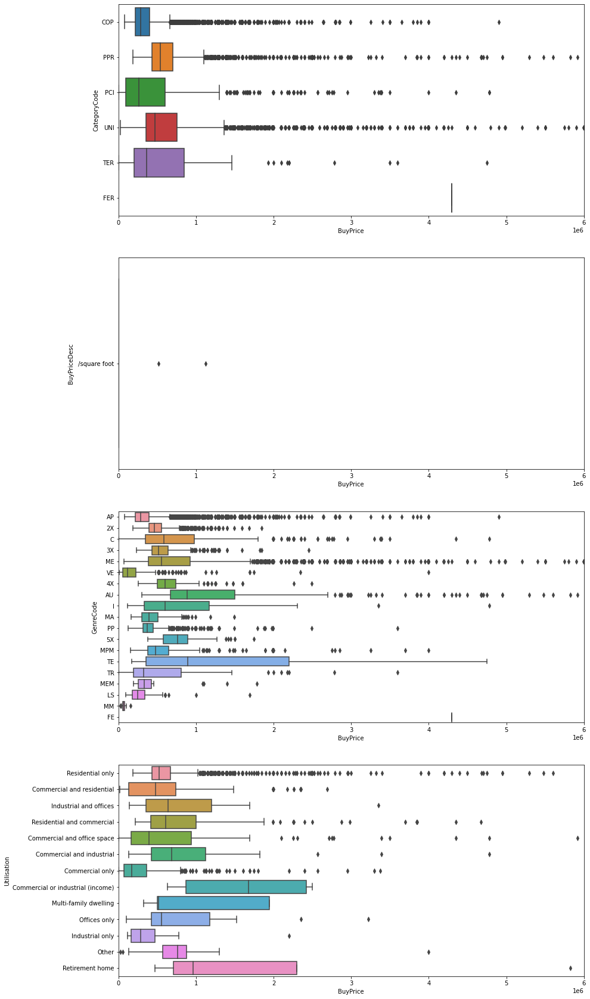

In [23]:
plt.figure(figsize=[14, 30])
for i, column in enumerate(categorical_columns_1):
    plt.subplot(len(categorical_columns_1), 1, i+1)
    sns.boxplot(data=listings, y=column, x='BuyPrice')
    plt.xlim((0, 6*10**6))
plt.show()

In [24]:
print(listings.BuyPriceDesc.count())
listings.groupby(['BuyPriceDesc']).count().BuyPrice

20


BuyPriceDesc
 /square foot    20
Name: BuyPrice, dtype: int64

**Conclusions**
1. `CategoryCode` - Most expensive are positions from categories: PPR amd UNI. 
2. `Utilisation` - connect 'Commercial and residential'  and 'Residential and commercial' into one.

## 1.4. Boolean columns
Columns to drop: `IsFavorite`, `IsRemoved`, `IsSubject`, `IsStrictQueryMatch`, `IsFavoriteDisplayed`, `IsRemovedDisplayed`, `IsEmptyView`, `IsMissingView`, `IsInFavorite`.

These columns contain only `False` values.

In [25]:
boolean_columns = ['IsNewPrice', 'IsNew']

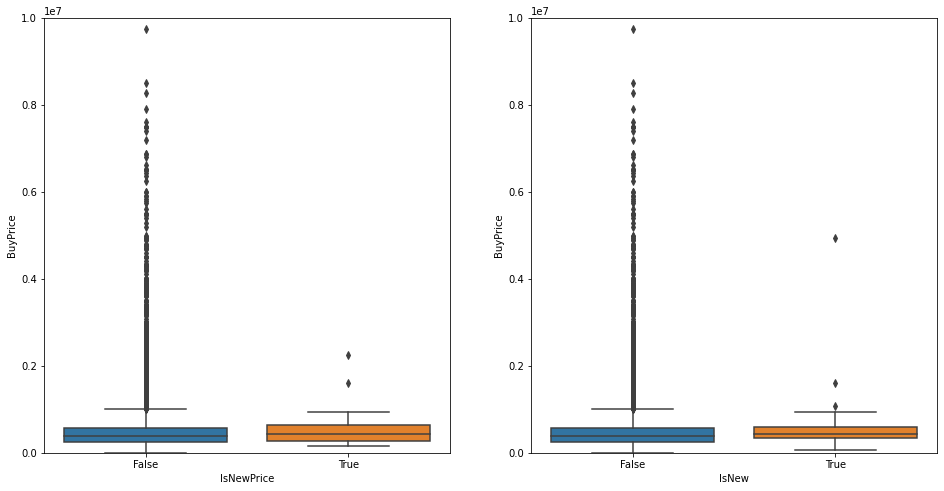

In [26]:
priceLimit =  10**7

plt.figure(figsize=[16,8])
for i, column in enumerate(boolean_columns):
    plt.subplot(1, len(boolean_columns), i+1)
    sns.boxplot(data=listings, y='BuyPrice', x=column)
    plt.ylim((0, priceLimit))
plt.show()

**Conclusions**

It looks as if `IsNewPrice` and `IsNew` wre not important for price prediction.

# 2. houses, firestations.csv, policeCoord.csv

## 2.1. Overview

In [27]:
df_firestations = pd.read_csv("data/firestations.csv")

In [28]:
df_firestations

,address,lat,lng
0,550 Blvd. St. Pierre,45.502644,-73.559248
1,230 Blvd.Chèvremont,45.493473,-73.876561
2,13795 Blvd. Pierrefonds,45.493300,-73.849787
3,13 rue Centre Commercial,45.509543,-73.806234
4,10 Sunnydale,45.493874,-73.806822
...,...,...,...
59,12012 Rolland,45.603015,-73.558874
60,7650 Blvd. Chateauneuf,45.448281,-73.635724
61,11371 Notre Dame,45.448827,-73.634508
62,11575 26th Ave.,45.671462,-73.504329


In [29]:
df_policestations = pd.read_csv("data/policeCoord.csv")

In [30]:
df_policestations

,long,lat
0,-73.542094,45.583362
1,-73.617431,45.577735
2,-73.545913,45.556857
3,-73.701026,45.528533
4,-73.593463,45.585063
5,-73.615622,45.607714
6,-73.815896,45.447874
7,-73.598652,45.486393
8,-73.591197,45.525262
9,-73.584954,45.463708


## 2.2. Map

In [31]:
world = folium.Map(
    zoom_start=10,
    location=[45.568569, -73.653614])

In [32]:
world

### 2.2.1. Adding firestations to the map

In [33]:
for _, firestation in df_firestations.iterrows():
    folium.Marker(
        location=[firestation['lat'], firestation['lng']],
        popup='fire station',
        tooltip='fire station',
        icon=folium.Icon(color='red', prefix='fa', icon='circle'),
    ).add_to(world)

In [34]:
world

### 2.2.2. Adding police stations to the map

In [35]:
for _, policestation in df_policestations.iterrows():
    folium.Marker(
        location=[policestation['lat'], policestation['long']],
        popup='police station',
        tooltip='police station',
        icon=folium.Icon(color='blue', prefix='fa', icon='circle'),
    ).add_to(world)

In [36]:
world

### 2.2.3. Adding properties from listings.csv and listings_v2.csv to the map

In [37]:
df_houses = pd.read_csv("data/listings.csv")

In [38]:
df_houses2 = pd.read_csv("data/listings_v2.csv", encoding='latin-1')

In [39]:
df_houses

,__type,MlsNumber,CategoryCode,Lat,Lng,Address,City,Quartier,ShortCity,PostalCode,ShortDescription,LongDescription,PhotoText,BuyPrice,BuyPriceDesc,LocationPrice,LocationPriceDesc,Category,Construction,OpenHouse,GenreCode,CatgCode,Utilisation,RevenuEffectif,RevenuBrutPotentiel,WalkScore,SuperficieTerrain,NbPieces,NbChambres,NbSallesEaux,NbSallesBains,NbFoyerPoele,NbEquipements,NbGarages,NbStationnements,NbPiscines,NbBordEaux,NbAnimals,NbCultures,DiffusionWebUrl,PhotoUrl,PhotoPrintingUrl,FinancialToolUrl,PasserelleUrl,CommunityUrl,GoogleStreetViewUrl,WalkScoreUrl,VisiteVirtuelleUrl,ShareThisUrl,SummaryUrl,PrintingPageUrl,IsFavorite,IsRemoved,IsSubject,IsStrictQueryMatch,IsFavoriteDisplayed,IsRemovedDisplayed,IsNewPrice,IsNew,PageTitle,IsEmptyView,Langue,GoogleMapAddressLink,IsMissingView,IsInFavorite
0,Centris.CentrisCA.Domain.Views.PropertyView,9027411,COP,45.556508,-73.633198,"8708, Av. André-Grasset, apt. 202",Ahuntsic-Cartierville (Montréal),Ahuntsic Central,Ahuntsic-Cartierville (Montréal),H2M 2L4,NaN,"PRIX POUR VENTE RAPIDE. Superbe condo ensoleillé 1 chambre, très rare sur le marché! Grand salon, chambre avec 2 garde-robe, rangement, coin repas qui donne accès au balcon côté sud, air climatisé mural, plancher de béton, terrasse sur le toit avec vue panoramique, tranquille, à proximité de plusieurs services et autoroutes, libre immédiatement.","Condos for sale in Ahuntsic-Cartierville (Montréal), Montréal (Island) – 8708, Av. André-Grasset, apt. 202, 9027411 | Centris","$187,500",NaN,NaN,NaN,"Condo/Loft, Apartment, Detached",Construction 1988,"Open house: 11/09/2014, 2 PM - 4 PM",AP,COP,NaN,0,0,60,0,5,1,0,1,0,0,0,1,0,0,0,0,http://diffusionweb.centris.ca/photoviewer.aspx?tok=A04104CDDBF96E2DDD2503&lang=en,http://ms1.centris.ca/media.ashx?id=ADDD250D1BD4CBBDDBF96E2D1D&t=pi&sm=c&w=140&h=105,http://ms1.centris.ca/media.ashx?id=ADDD250D1BD4CBBDDBF96E2D1D&t=pi&sm=c&w=500&h=375,http://services.centris.ca/sectionPublic/Calculatrice.aspx?langue=en&demandeur=MT&montant=187500&iframe=true&width=950&height=490,http://passerelle.centris.ca/redirect.aspx?&CodeDest=PROPRIO&NoMLS=MT9027411&Lang=E,/CommunitiesPopup.aspx?mun=840&lang=en&defaulttab=0&showsearch=0&ShowBreadcrumbs=0&Mode=3&iframe=true&width=950&height=490,"http://maps.google.com/maps?q=45.556508,-73.633198&layer=c&cbll=45.556508,-73.633198&cbp=12,173.33,,0,5&iframe=true&width=950&height=490&hl=en",http://www.walkscore.com/score/loc/lat=45.556508/lng=-73.633198,NaN,http://www.centris.ca//en/condos~for-sale~ahuntsic-cartierville-montreal~montreal-island~8708-av.-andre-grasset-apt.-202/9027411,/en/condos~for-sale~ahuntsic-cartierville-montreal~montreal-island~8708-av.-andre-grasset-apt.-202/9027411?view=Summary&sort=Ville&uc=3,/en/print/property/9027411,False,False,False,False,True,True,False,False,"Condos for sale in Ahuntsic-Cartierville (Montréal), Montréal (Island) – 8708, Av. André-Grasset, apt. 202, 9027411 | Centris",False,NaN,"https://maps.google.ca/maps?z=17&q=45.556508,-73.633198&hl=en",False,False
1,Centris.CentrisCA.Domain.Views.PropertyView,9030205,PPR,45.542062,-73.696868,"12064 - 12066, Rue Valmont",Ahuntsic-Cartierville (Montréal),Nouveau Bordeaux,Ahuntsic-Cartierville (Montréal),H3M 2V5,NaN,"Duplex à vendre à Ahuntsic près de la rivière, parc, commerces et banques... Rare sur le marché, RDC et sous-sol libre pour l'acheteur, très grand terrain de plus 6000pc, toiture refaite en 2005, sous-sol fini. 4 chambres, salle familiale, s/lavage ind., belle cour intime avec grand cabanon, 4 places de stationnements. WOW Libre immédiatement !","Duplexes for sale in Ahuntsic-Cartierville (Montréal), Montréal (Island) – 12064 - 12066, Rue Valmont, 9030205 | Centris","$574,900",NaN,NaN,NaN,"Duplex, Detached",Construction 1955,NaN,2X,PPR,Residential only,0,26760,75,0,11,4,0,1,0,0,0,1,0,0,0,0,http://diffusionweb.centris.ca/photoviewer.aspx?tok=A04104CDDBF7823DDD2505&lang=en,http://ms1.centris.ca/media.ashx?id=ADDD250D1056342DDBF7823D1A&t=pi&sm=c&w=140&h=105,http://ms1.centris.ca

In [40]:
df_houses['City'].unique()

array(['Ahuntsic-Cartierville (Montréal)', 'Anjou (Montréal)',
       "Baie-d'Urfé", 'Beaconsfield',
       'Côte-des-Neiges/Notre-Dame-de-Grâce (Montréal)', 'Côte-Saint-Luc',
       'Dollard-Des Ormeaux', 'Dorval', 'Hampstead', 'Kirkland',
       'Lachine (Montréal)', 'LaSalle (Montréal)',
       'Le Plateau-Mont-Royal (Montréal)', 'Le Sud-Ouest (Montréal)',
       "L'Île-Bizard/Sainte-Geneviève (Montréal)",
       'Mercier/Hochelaga-Maisonneuve (Montréal)', 'Montréal-Est',
       'Montréal-Nord (Montréal)', 'Montréal-Ouest', 'Mont-Royal',
       'Outremont (Montréal)', 'Pierrefonds-Roxboro (Montréal)',
       'Pointe-Claire',
       'Rivière-des-Prairies/Pointe-aux-Trembles (Montréal)',
       'Rosemont/La Petite-Patrie (Montréal)', 'Sainte-Anne-de-Bellevue',
       'Saint-Laurent (Montréal)', 'Saint-Léonard (Montréal)',
       'Senneville', 'Verdun/Île-des-Soeurs (Montréal)',
       'Ville-Marie (Montréal)',
       'Villeray/Saint-Michel/Parc-Extension (Montréal)', 'Westmount'],
   

In [41]:
df_houses2

,MlsNumber,Lat,Lng,City,BuyPrice,ConstructionYear,GenreCode,CatgCode,WalkScore,NbPieces,NbChambres,NbSallesEaux,NbSallesBains,NbFoyerPoele,NbEquipements,NbGarages,NbStationnements,NbPiscines,NbBordEaux,NbAnimals,NbCultures,IsNewPrice,IsNew,RevenuBrutPotentiel
0,9027411,45.556508,-73.633198,Ahuntsic-Cartierville (MontrÌ©al),187500,1988.0,AP,COP,60,5,1,0,1,0,0,0,1,0,0,0,0,0,0,0
1,9041238,45.573887,-73.649079,Ahuntsic-Cartierville (MontrÌ©al),475000,1959.0,C,PCI,88,0,0,0,0,0,0,0,1,0,0,0,0,0,0,26760
2,9066959,45.533876,-73.672649,Ahuntsic-Cartierville (MontrÌ©al),200000,2011.0,AP,COP,63,6,1,0,1,0,0,0,0,0,0,0,0,0,0,0
3,9094378,45.534057,-73.674738,Ahuntsic-Cartierville (MontrÌ©al),217000,2013.0,AP,COP,71,3,1,0,1,0,0,2,1,0,0,0,0,0,0,22800
4,9112562,45.520925,-73.738791,Ahuntsic-Cartierville (MontrÌ©al),1480000,2007.0,ME,UNI,18,12,5,1,4,1,0,2,2,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14662,27754688,45.548423,-73.663695,Ahuntsic-Cartierville (MontrÌ©al),5599000,1958.0,AU,PPR,90,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
14663,10191214,45.435386,-73.815619,Pointe-Claire,1295000,1922.0,AU,PPR,42,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14664,10547495,45.534136,-73.566041,Le Plateau-Mont-Royal (MontrÌ©al),7900000,1962.0,AU,PPR,92,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14665,24962402,45.546910,-73.541058,Mercier/Hochelaga-Maisonneuve (MontrÌ©al),6700000,NaN,AU,PPR,94,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [42]:
df_houses = df_houses[["Lat", "Lng"]]

In [43]:
df_houses

,Lat,Lng
0,45.556508,-73.633198
1,45.542062,-73.696868
2,45.573887,-73.649079
3,45.571040,-73.643413
4,45.533876,-73.672649
...,...,...
14662,45.481498,-73.591471
14663,45.479493,-73.600415
14664,45.488253,-73.587413
14665,45.487523,-73.608672


In [44]:
df_houses2 = df_houses2[["Lat", "Lng"]]

In [45]:
df_houses2

,Lat,Lng
0,45.556508,-73.633198
1,45.573887,-73.649079
2,45.533876,-73.672649
3,45.534057,-73.674738
4,45.520925,-73.738791
...,...,...
14662,45.548423,-73.663695
14663,45.435386,-73.815619
14664,45.534136,-73.566041
14665,45.546910,-73.541058


#### Merging both data frames

In [46]:
df_houses = df_houses.append(df_houses2)
df_houses

,Lat,Lng
0,45.556508,-73.633198
1,45.542062,-73.696868
2,45.573887,-73.649079
3,45.571040,-73.643413
4,45.533876,-73.672649
...,...,...
14662,45.548423,-73.663695
14663,45.435386,-73.815619
14664,45.534136,-73.566041
14665,45.546910,-73.541058


In [47]:
df_houses.drop_duplicates(subset =["Lat", "Lng"],
                     inplace = True)
 
df_houses

,Lat,Lng
0,45.556508,-73.633198
1,45.542062,-73.696868
2,45.573887,-73.649079
3,45.571040,-73.643413
4,45.533876,-73.672649
...,...,...
14662,45.481498,-73.591471
14663,45.479493,-73.600415
14664,45.488253,-73.587413
14665,45.487523,-73.608672


In [48]:
FastMarkerCluster(df_houses[['Lat', 'Lng']].values.tolist()).add_to(world)

In [49]:
world

# 3. Montreal HPI

In [50]:
df_hpi = pd.read_csv("data/montreal_hpi.csv")

## 3.1. Overview

In [51]:
df_hpi

,Date,Composite_HPI,Single_Family_HPI,One_Storey_HPI,Two_Storey_HPI,Townhouse_HPI,Apartment_HPI,Composite_Benchmark,Single_Family_Benchmark,One_Storey_Benchmark,Two_Storey_Benchmark,Townhouse_Benchmark,Apartment_Benchmark
0,Jan 2005,100.0,100.0,100.0,100.0,100.0,100.0,192200,200200,165400,245400,178600,163300
1,Feb 2005,101.3,101.3,101.6,100.9,104.8,100.9,194700,202800,168100,247600,187200,164800
2,Mar 2005,102.4,102.6,103.1,102.0,104.6,101.4,196800,205400,170600,250300,186800,165600
3,Apr 2005,103.2,103.4,104.1,102.5,105.7,102.1,198400,207000,172200,251500,188800,166800
4,May 2005,103.6,103.9,104.7,102.8,104.9,102.4,199100,208000,173200,252300,187400,167300
...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,Jun 2014,156.6,157.6,159.2,155.8,172.1,154.0,301000,315500,263400,382300,307400,251500
114,Jul 2014,156.0,156.6,157.5,155.6,173.3,154.0,299800,313500,260600,381800,309600,251500
115,Aug 2014,155.5,156.2,156.7,155.5,174.0,153.6,298900,312700,259200,381600,310800,250900
116,Sep 2014,155.2,156.0,156.8,155.0,174.4,152.9,298300,312300,259400,380300,311500,249700


A house price index (HPI) measures the price changes of residential housing as a percentage change from some specific start date (which has HPI of 100). Methodologies commonly used to calculate a HPI are the hedonic regression (HR), simple moving average (SMA) and repeat-sales regression (RSR).

In [52]:
df_hpi.describe()

,Composite_HPI,Single_Family_HPI,One_Storey_HPI,Two_Storey_HPI,Townhouse_HPI,Apartment_HPI,Composite_Benchmark,Single_Family_Benchmark,One_Storey_Benchmark,Two_Storey_Benchmark,Townhouse_Benchmark,Apartment_Benchmark
count,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000,118.000000
mean,133.454237,134.139831,136.000847,131.922034,143.908475,131.145763,256511.016949,268517.796610,224981.355932,323717.796610,257054.237288,214204.237288
std,17.852715,17.719240,17.376497,18.212310,22.840927,18.465397,34312.955825,35478.127682,28743.623445,44684.393022,40797.983954,30164.612181
min,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,192200.000000,200200.000000,165400.000000,245400.000000,178600.000000,163300.000000
25%,118.200000,119.350000,122.325000,115.825000,123.850000,114.075000,227175.000000,238900.000000,202350.000000,284200.000000,221250.000000,186300.000000
50%,133.250000,134.300000,137.000000,131.150000,144.900000,130.200000,256100.000000,268800.000000,226600.000000,321800.000000,258800.000000,212700.000000
75%,151.000000,150.650000,151.425000,149.375000,161.500000,150.375000,290200.000000,301600.000000,250475.000000,366550.000000,288500.000000,245650.000000
max,156.900000,158.300000,159.700000,156.600000,180.100000,154.600000,301600.000000,316900.000000,264200.000000,384300.000000,321700.000000,252500.000000


In [53]:
df_hpi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Date                     118 non-null    object 
 1   Composite_HPI            118 non-null    float64
 2   Single_Family_HPI        118 non-null    float64
 3   One_Storey_HPI           118 non-null    float64
 4   Two_Storey_HPI           118 non-null    float64
 5   Townhouse_HPI            118 non-null    float64
 6   Apartment_HPI            118 non-null    float64
 7   Composite_Benchmark      118 non-null    int64  
 8   Single_Family_Benchmark  118 non-null    int64  
 9   One_Storey_Benchmark     118 non-null    int64  
 10  Two_Storey_Benchmark     118 non-null    int64  
 11  Townhouse_Benchmark      118 non-null    int64  
 12  Apartment_Benchmark      118 non-null    int64  
dtypes: float64(6), int64(6), object(1)
memory usage: 12.1+ KB


In [54]:
len(df_hpi[df_hpi.isin(['0']).any(axis=1)])

0

## 3.2. Graphs

### 3.2.1. Histograms

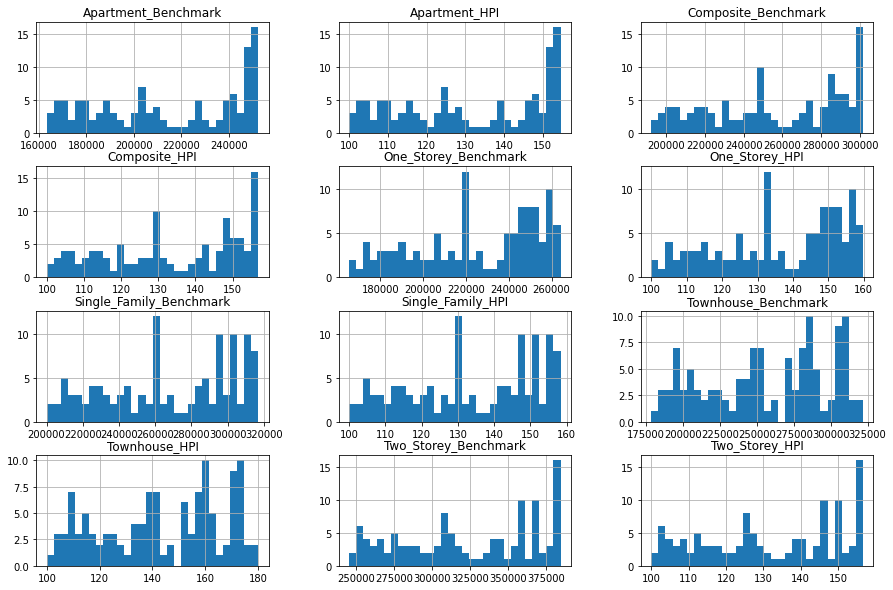

In [55]:
df_hpi.hist(bins=30, figsize=(15, 10))
plt.show()

### 3.2.2. Correlation matrix

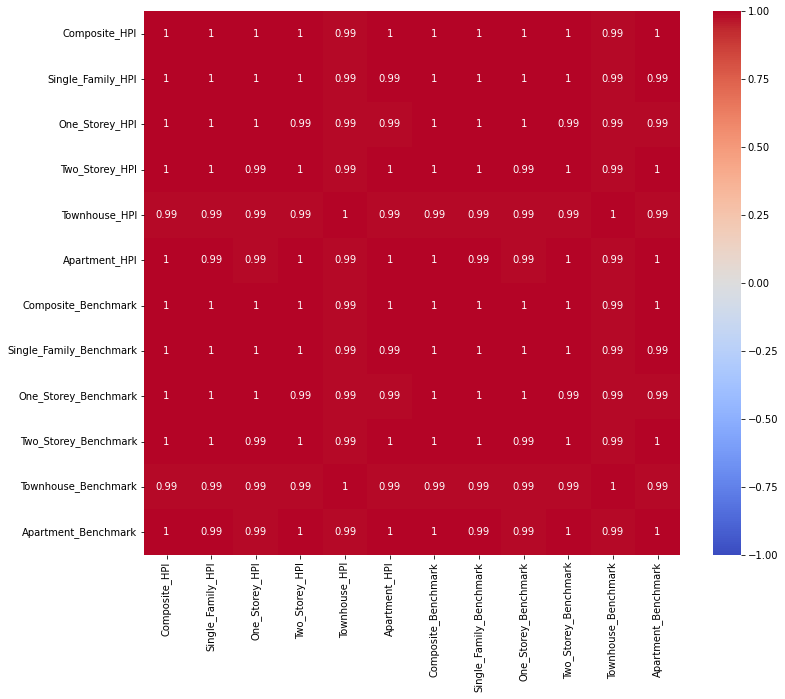

In [56]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_hpi.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot = True)
plt.show()

As you can see, in this dataframe all variables are highly correlated with each other

## 3.3. Further column analysis

### 3.3.1. Percentage of unique values

In [57]:
df_hpi.nunique() / len(df_hpi) * 100

Date                       100.000000
Composite_HPI               87.288136
Single_Family_HPI           87.288136
One_Storey_HPI              92.372881
Two_Storey_HPI              89.830508
Townhouse_HPI               90.677966
Apartment_HPI               88.135593
Composite_Benchmark         87.288136
Single_Family_Benchmark     87.288136
One_Storey_Benchmark        92.372881
Two_Storey_Benchmark        89.830508
Townhouse_Benchmark         90.677966
Apartment_Benchmark         88.135593
dtype: float64

### 3.3.2. Profile report

In [58]:
df_hpi.profile_report()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


# 4. Sociodemographical data
sociodemo.csv

## 4.1. Overview

In [59]:
df_sociodemo = pd.read_csv("data/sociodemo.csv", encoding='latin-1')

In [60]:
df_sociodemo

,Municipality,Population,Variation,Density,avgAge,below15,below24,below44,below64,below65,AvgIncome,below50000,below80000,below100000,below150000,above150001,avgSize,totalHouse,size1,size2,size3,size4,size5,totalFam,Children,NoChildren,Single,Unemploy,Owner,Renter,totaldwelling,before1960,before1980,before1990,before2000,before2005,before2011,Single.1,Semi,Duplex,Buildings,Mobile,belowBach,Bach,abvBach,University,College,Secondary,Apprentice,No,NonImmigrant,Immigrant,french,English,Others
0,Ahuntsic-Cartierville,126891,2,5256,41,16,11,29,26,18,54557,57,22,8,7,6,2.2,56880,41,29,14,15,1,31800,44,36,20,10,39,61,56910,42,36,15,3,2,2,10,5,75,10,0,6,18,12,36,16,20,10,18,60,40,64,10,26
1,Anjou,41928,3,3064,43,16,10,24,28,22,57384,51,28,8,8,5,2.1,19120,38,33,13,14,2,11455,39,41,20,9,44,56,19125,14,53,15,7,8,3,8,9,64,20,0,5,13,6,24,15,23,15,23,71,29,76,8,16
2,Baie-d'Urfí©,3850,-1,639,43,18,14,16,32,20,139113,21,17,7,19,36,2.8,1385,17,37,15,29,2,1160,50,40,10,7,90,10,1385,54,21,16,6,1,2,90,3,7,0,0,6,26,25,57,13,18,3,9,70,30,19,72,9
3,Beaconsfield,19505,2,1772,40,19,15,18,32,16,152181,20,15,10,21,34,2.9,6685,15,32,18,33,2,5650,56,33,11,6,90,10,6690,32,52,8,4,1,3,86,9,5,0,0,5,27,19,51,18,18,5,8,76,24,21,73,6
4,CíÇte-des-Neiges/Notre-Dame-de-Grí¢ce,165031,0,7699,38,16,14,33,23,14,48594,64,19,6,5,6,2.2,74270,40,29,15,15,1,39375,45,33,22,11,26,74,74235,59,29,7,2,1,2,3,6,70,22,0,6,23,19,48,15,20,6,11,47,53,32,39,29
5,CíÇte-Saint-Luc,32321,3,4649,45,16,11,22,23,28,84076,50,18,8,11,13,2.3,13570,36,31,13,17,3,8555,45,40,15,9,50,50,13565,17,47,16,3,4,13,14,16,16,54,0,8,21,17,46,13,21,7,13,52,48,16,62,22
6,Dollard-Des Ormeaux,49637,1,3287,40,17,15,23,30,15,94374,34,22,11,18,15,2.9,16955,19,28,18,31,4,13895,55,29,16,8,78,22,16955,5,64,16,7,5,3,59,20,15,6,0,7,19,10,36,19,24,7,14,60,40,16,62,22
7,Dorval,18208,1,872,42,14,13,24,31,18,76300,44,23,10,14,9,2.2,7990,36,32,14,17,1,4915,44,39,17,7,59,41,7995,51,28,10,4,3,4,49,6,34,10,1,7,16,11,34,19,26,9,12,71,29,31,57,12
8,Hampstead,7153,2,3996,39,20,15,21,27,17,190883,28,14,4,15,39,2.8,2515,21,30,14,29,6,1940,56,33,11,5,69,31,2515,51,44,4,0,1,0,50,8,33,9,0,7,26,24,57,15,15,4,9,71,29,15,76,9
9,Kirkland,21253,4,2204,39,17,17,19,34,13,128477,18,19,12,22,29,3.1,6830,12,27,20,37,4,6070,61,28,11,7,94,6,6825,2,44,32,14,6,2,85,9,1,5,0,7,22,14,43,20,21,6,10,72,28,19,68,13


In [61]:
df_sociodemo.describe()

,Population,Variation,Density,avgAge,below15,below24,below44,below64,below65,AvgIncome,below50000,below80000,below100000,below150000,above150001,avgSize,totalHouse,size1,size2,size3,size4,size5,totalFam,Children,NoChildren,Single,Unemploy,Owner,Renter,totaldwelling,before1960,before1980,before1990,before2000,before2005,before2011,Single.1,Semi,Duplex,Buildings,Mobile,belowBach,Bach,abvBach,University,College,Secondary,Apprentice,No,NonImmigrant,Immigrant,french,English,Others
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,57165.939394,1.727273,4041.363636,40.515152,16.090909,13.151515,26.090909,28.030303,16.636364,86489.757576,45.696970,21.000000,8.151515,11.090909,14.090909,2.354545,25740.151515,32.575758,31.030303,14.696970,19.484848,2.212121,14392.575758,44.666667,37.000000,18.333333,8.000000,53.060606,46.939394,25738.030303,42.454545,33.575758,12.000000,5.454545,3.333333,3.242424,29.575758,10.030303,48.424242,11.909091,0.181818,5.606061,18.696970,14.333333,38.636364,15.636364,20.636364,8.969697,16.121212,68.090909,31.909091,45.939394,38.090909,15.969697
std,47291.075249,3.115212,2861.069116,1.970425,2.876235,1.856092,6.709898,3.432245,3.895656,48328.893126,16.310435,3.508917,2.320038,5.653338,12.654949,0.358897,22954.501822,11.090622,2.651472,2.567645,8.128350,1.293193,11474.376421,8.568353,6.656763,5.271780,2.345208,21.615879,21.615879,22932.772808,22.293624,15.276678,8.385255,4.880387,2.618046,2.817693,29.650074,7.312168,29.237209,13.337831,0.391675,1.367923,6.390837,8.387739,15.155070,2.759282,3.765121,4.759759,7.952034,10.501082,10.501082,23.473309,25.113945,9.288719
min,920.000000,-4.000000,123.000000,37.000000,7.000000,10.000000,16.000000,22.000000,10.000000,41295.000000,18.000000,14.000000,4.000000,3.000000,0.000000,1.700000,350.000000,12.000000,27.000000,8.000000,5.000000,0.000000,295.000000,26.000000,28.000000,10.000000,4.000000,24.000000,6.000000,350.000000,2.000000,13.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,1.000000,0.000000,0.000000,2.000000,5.000000,2.000000,9.000000,9.000000,14.000000,2.000000,6.000000,46.000000,9.000000,14.000000,4.000000,2.000000
25%,19503.000000,0.000000,2194.000000,39.000000,15.000000,12.000000,21.000000,25.000000,13.000000,50556.000000,30.000000,19.000000,7.000000,6.000000,5.000000,2.200000,6830.000000,24.000000,29.000000,13.000000,15.000000,1.000000,5200.000000,40.000000,33.000000,15.000000,6.000000,36.000000,28.000000,6825.000000,26.000000,24.000000,7.000000,3.000000,1.000000,2.000000,5.000000,5.000000,28.000000,3.000000,0.000000,5.000000,13.000000,8.000000,26.000000,14.000000,18.000000,6.000000,10.000000,60.000000,24.000000,21.000000,17.000000,10.000000
50%,41928.000000,2.000000,3615.000000,40.000000,16.000000,13.000000,24.000000,28.000000,16.000000,64459.000000,50.000000,21.000000,8.000000,9.000000,9.000000,2.300000,18555.000000,36.000000,31.000000,15.000000,17.000000,2.000000,11455.000000,45.000000,36.000000,17.000000,8.000000,50.000000,50.000000,18540.000000,48.000000,29.000000,10.000000,4.000000,2.000000,3.000000,14.000000,8.000000,46.000000,6.000000,0.000000,6.000000,19.000000,13.000000,40.000000,15.000000,21.000000,8.000000,14.000000,71.000000,29.000000,43.000000,32.000000,13.000000
75%,83868.000000,3.000000,5614.000000,42.000000,18.000000,14.000000,30.000000,31.000000,19.000000,94374.000000,60.000000,23.000000,10.000000,15.000000,29.000000,2.600000,37075.000000,39.000000,32.000000,17.000000,26.000000,3.000000,21065.000000,52.000000,41.000000,22.000000,10.000000,7

In [62]:
df_sociodemo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Municipality   33 non-null     object 
 1   Population     33 non-null     int64  
 2   Variation      33 non-null     int64  
 3   Density        33 non-null     int64  
 4   avgAge         33 non-null     int64  
 5   below15        33 non-null     int64  
 6   below24        33 non-null     int64  
 7   below44        33 non-null     int64  
 8   below64        33 non-null     int64  
 9   below65        33 non-null     int64  
 10  AvgIncome      33 non-null     int64  
 11  below50000     33 non-null     int64  
 12  below80000     33 non-null     int64  
 13  below100000    33 non-null     int64  
 14  below150000    33 non-null     int64  
 15  above150001    33 non-null     int64  
 16  avgSize        33 non-null     float64
 17  totalHouse     33 non-null     int64  
 18  size1       

## 4.2. Fixing special characters in cities' names

* Ahuntsic-Cartierville (Montréal)
* Anjou (Montréal)
* Baie-d'Urfé
* Beaconsfield
* Côte-des-Neiges/Notre-Dame-de-Grâce (Montréal) 
* Côte-Saint-Luc
* Dollard-Des Ormeaux 
* Dorval 
* Hampstead
* Kirkland
* Lachine (Montréal) 
* LaSalle (Montréal)
* Le Plateau-Mont-Royal (Montréal) 
* Le Sud-Ouest (Montréal)
* L'Île-Bizard/Sainte-Geneviève (Montréal)
* Mercier/Hochelaga-Maisonneuve (Montréal) 
* Montréal-Est
* Montréal-Nord (Montréal)
* Montréal-Ouest
* Mont-Royal
* Outremont (Montréal)
* Pierrefonds-Roxboro (Montréal)
* Pointe-Claire
* Rivière-des-Prairies/Pointe-aux-Trembles (Montréal)
* Rosemont/La Petite-Patrie (Montréal) 
* Sainte-Anne-de-Bellevue
* Saint-Laurent (Montréal)
* Saint-Léonard (Montréal)
* Senneville
* Verdun/Île-des-Soeurs (Montréal)
* Ville-Marie (Montréal)
* Villeray/Saint-Michel/Parc-Extension (Montréal)
* Westmount


In [63]:
df_sociodemo.at[2,"Municipality"] = "Baie-d'Urfé"
df_sociodemo.at[4,"Municipality"] = "Côte-des-Neiges/Notre-Dame-de-Grâce (Montréal)"
df_sociodemo.at[5,"Municipality"] = "Côte-Saint-Luc"
df_sociodemo.at[10,"Municipality"] = "L'Île-Bizard/Sainte-Geneviève (Montréal)"
df_sociodemo.at[17,"Municipality"] = "Montréal-Est"
df_sociodemo.at[18,"Municipality"] = "Montréal-Nord"
df_sociodemo.at[19,"Municipality"] = "Montréal-Ouest"
df_sociodemo.at[23,"Municipality"] = "Rivière-des-Prairies/Pointe-aux-Trembles (Montréal)"
df_sociodemo.at[25,"Municipality"] = "Saint-Léonard (Montréal)"
df_sociodemo.at[29,"Municipality"] = "Verdun/Île-des-Soeurs (Montréal)"

In [64]:
df_sociodemo

,Municipality,Population,Variation,Density,avgAge,below15,below24,below44,below64,below65,AvgIncome,below50000,below80000,below100000,below150000,above150001,avgSize,totalHouse,size1,size2,size3,size4,size5,totalFam,Children,NoChildren,Single,Unemploy,Owner,Renter,totaldwelling,before1960,before1980,before1990,before2000,before2005,before2011,Single.1,Semi,Duplex,Buildings,Mobile,belowBach,Bach,abvBach,University,College,Secondary,Apprentice,No,NonImmigrant,Immigrant,french,English,Others
0,Ahuntsic-Cartierville,126891,2,5256,41,16,11,29,26,18,54557,57,22,8,7,6,2.2,56880,41,29,14,15,1,31800,44,36,20,10,39,61,56910,42,36,15,3,2,2,10,5,75,10,0,6,18,12,36,16,20,10,18,60,40,64,10,26
1,Anjou,41928,3,3064,43,16,10,24,28,22,57384,51,28,8,8,5,2.1,19120,38,33,13,14,2,11455,39,41,20,9,44,56,19125,14,53,15,7,8,3,8,9,64,20,0,5,13,6,24,15,23,15,23,71,29,76,8,16
2,Baie-d'Urfé,3850,-1,639,43,18,14,16,32,20,139113,21,17,7,19,36,2.8,1385,17,37,15,29,2,1160,50,40,10,7,90,10,1385,54,21,16,6,1,2,90,3,7,0,0,6,26,25,57,13,18,3,9,70,30,19,72,9
3,Beaconsfield,19505,2,1772,40,19,15,18,32,16,152181,20,15,10,21,34,2.9,6685,15,32,18,33,2,5650,56,33,11,6,90,10,6690,32,52,8,4,1,3,86,9,5,0,0,5,27,19,51,18,18,5,8,76,24,21,73,6
4,Côte-des-Neiges/Notre-Dame-de-Grâce (Montréal),165031,0,7699,38,16,14,33,23,14,48594,64,19,6,5,6,2.2,74270,40,29,15,15,1,39375,45,33,22,11,26,74,74235,59,29,7,2,1,2,3,6,70,22,0,6,23,19,48,15,20,6,11,47,53,32,39,29
5,Côte-Saint-Luc,32321,3,4649,45,16,11,22,23,28,84076,50,18,8,11,13,2.3,13570,36,31,13,17,3,8555,45,40,15,9,50,50,13565,17,47,16,3,4,13,14,16,16,54,0,8,21,17,46,13,21,7,13,52,48,16,62,22
6,Dollard-Des Ormeaux,49637,1,3287,40,17,15,23,30,15,94374,34,22,11,18,15,2.9,16955,19,28,18,31,4,13895,55,29,16,8,78,22,16955,5,64,16,7,5,3,59,20,15,6,0,7,19,10,36,19,24,7,14,60,40,16,62,22
7,Dorval,18208,1,872,42,14,13,24,31,18,76300,44,23,10,14,9,2.2,7990,36,32,14,17,1,4915,44,39,17,7,59,41,7995,51,28,10,4,3,4,49,6,34,10,1,7,16,11,34,19,26,9,12,71,29,31,57,12
8,Hampstead,7153,2,3996,39,20,15,21,27,17,190883,28,14,4,15,39,2.8,2515,21,30,14,29,6,1940,56,33,11,5,69,31,2515,51,44,4,0,1,0,50,8,33,9,0,7,26,24,57,15,15,4,9,71,29,15,76,9
9,Kirkland,21253,4,2204,39,17,17,19,34,13,128477,18,19,12,22,29,3.1,6830,12,27,20,37,4,6070,61,28,11,7,94,6,6825,2,44,32,14,6,2,85,9,1,5,0,7,22,14,43,20,21,6,10,72,28,19,68,13


## 4.3. Percentage of unique values

In [65]:
df_sociodemo.nunique() / len(df_sociodemo) * 100

Municipality     100.000000
Population       100.000000
Variation         39.393939
Density          100.000000
avgAge            27.272727
below15           33.333333
below24           24.242424
below44           66.666667
below64           39.393939
below65           42.424242
AvgIncome        100.000000
below50000        78.787879
below80000        36.363636
below100000       30.303030
below150000       48.484848
above150001       60.606061
avgSize           42.424242
totalHouse       100.000000
size1             72.727273
size2             30.303030
size3             33.333333
size4             66.666667
size5             21.212121
totalFam         100.000000
Children          60.606061
NoChildren        57.575758
Single            48.484848
Unemploy          30.303030
Owner             75.757576
Renter            75.757576
totaldwelling    100.000000
before1960        84.848485
before1980        78.787879
before1990        57.575758
before2000        39.393939
before2005        30

## 4.4. Graphs

### 4.4.1. Histograms

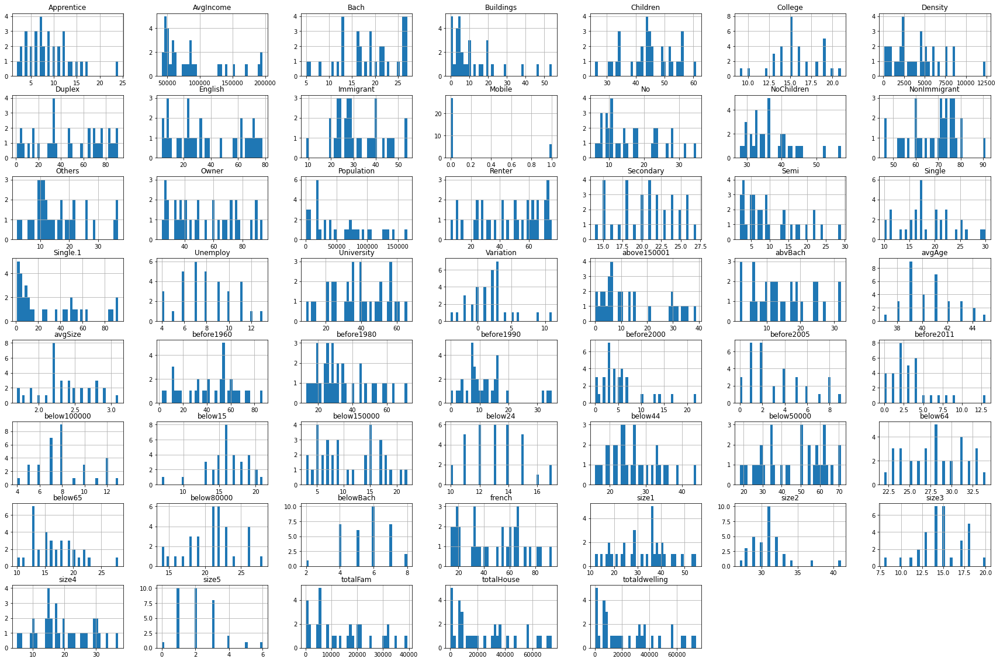

In [66]:
df_sociodemo.hist(bins=40, figsize=(30, 20))
plt.show()

### 4.4.2. Correlation matrix

In [67]:
# Get correlation matrix 
corr = df_sociodemo.corr()

# Create a mask for values above 90% 
# But also below 100% since it variables correlated with the same one
mask = (df_sociodemo.corr() > 0.9) & (df_sociodemo.corr() < 1.0)
high_corr = corr[mask]

# Create a new column mask using any() and ~
col_to_filter_out = ~high_corr[mask].any()

# Apply new mask
df_sociodemo_clean = df_sociodemo[high_corr.columns[col_to_filter_out]]

# Visualize cleaned dataset
df_sociodemo_clean

,Variation,Density,avgAge,below15,below24,below44,below64,below65,below80000,below100000,size2,size3,size5,NoChildren,Single,Unemploy,before1960,before1980,before1990,before2000,before2005,before2011,Semi,Duplex,Buildings,Mobile,belowBach,College,Secondary,Apprentice,No,NonImmigrant,Immigrant,french,English,Others
0,2,5256,41,16,11,29,26,18,22,8,29,14,1,36,20,10,42,36,15,3,2,2,5,75,10,0,6,16,20,10,18,60,40,64,10,26
1,3,3064,43,16,10,24,28,22,28,8,33,13,2,41,20,9,14,53,15,7,8,3,9,64,20,0,5,15,23,15,23,71,29,76,8,16
2,-1,639,43,18,14,16,32,20,17,7,37,15,2,40,10,7,54,21,16,6,1,2,3,7,0,0,6,13,18,3,9,70,30,19,72,9
3,2,1772,40,19,15,18,32,16,15,10,32,18,2,33,11,6,32,52,8,4,1,3,9,5,0,0,5,18,18,5,8,76,24,21,73,6
4,0,7699,38,16,14,33,23,14,19,6,29,15,1,33,22,11,59,29,7,2,1,2,6,70,22,0,6,15,20,6,11,47,53,32,39,29
5,3,4649,45,16,11,22,23,28,18,8,31,13,3,40,15,9,17,47,16,3,4,13,16,16,54,0,8,13,21,7,13,52,48,16,62,22
6,1,3287,40,17,15,23,30,15,22,11,28,18,4,29,16,8,5,64,16,7,5,3,20,15,6,0,7,19,24,7,14,60,40,16,62,22
7,1,872,42,14,13,24,31,18,23,10,32,14,1,39,17,7,51,28,10,4,3,4,6,34,10,1,7,19,26,9,12,71,29,31,57,12
8,2,3996,39,20,15,21,27,17,14,4,30,14,6,33,11,5,51,44,4,0,1,0,8,33,9,0,7,15,15,4,9,71,29,15,76,9
9,4,2204,39,17,17,19,34,13,19,12,27,20,4,28,11,7,2,44,32,14,6,2,9,1,5,0,7,20,21,6,10,72,28,19,68,13


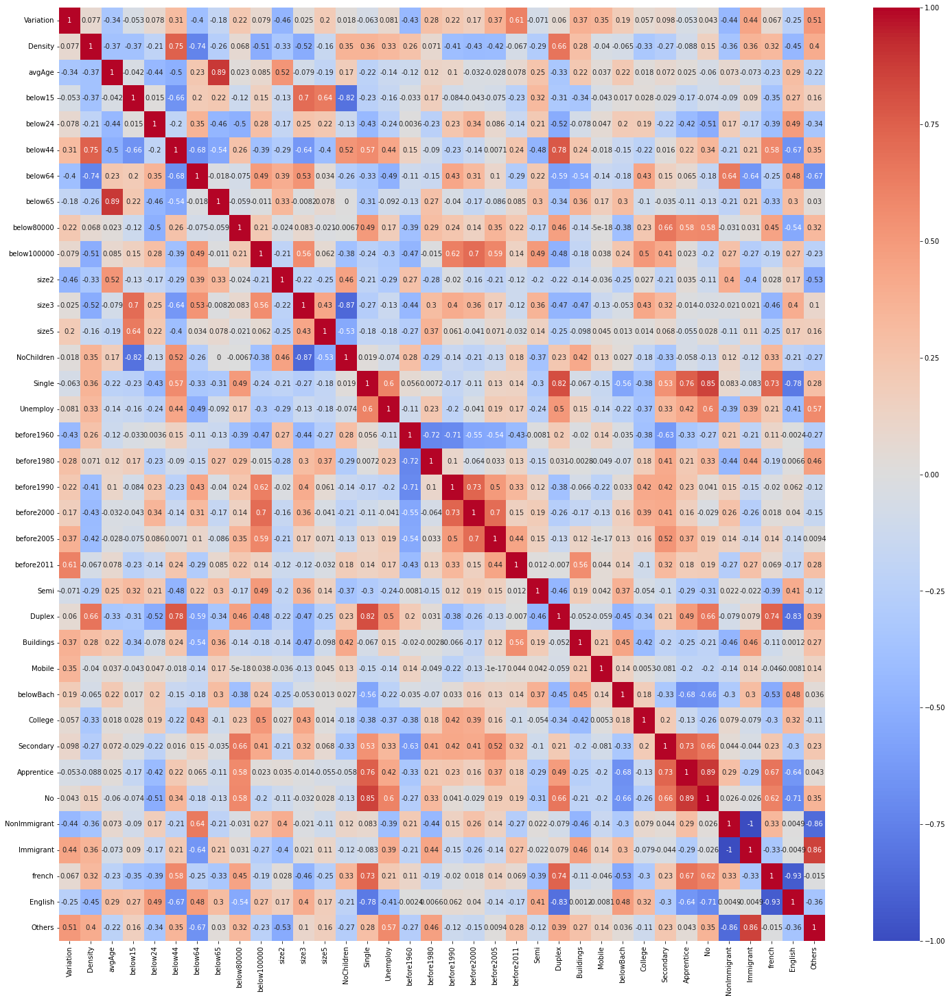

In [68]:
plt.figure(figsize=(25, 25))
sns.heatmap(df_sociodemo_clean.corr(), vmin=-1, vmax=1, cmap='coolwarm', annot = True)
plt.show()

# 5. Extra data 
extradata.csv

In [6]:
data = pd.read_csv("data/extra_data.csv")

## 5.1. Overview

Columns description

- `MlsNumber` - property id
- `LivingArea` - meterage, in variuos units
- `Proximity` - facilities in neighbourhood

Other columns to be dropped due to lack of data, lots of missing values and irrelevancy.

In [7]:
data = data[['MlsNumber', 'LivingArea', 'Proximity']]

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9016 entries, 0 to 9015
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   MlsNumber   9016 non-null   int64 
 1   LivingArea  5084 non-null   object
 2   Proximity   6916 non-null   object
dtypes: int64(1), object(2)
memory usage: 140.9+ KB


## 5. 2 Modifying columns

### 5.2.1 Transforming `LivingArea` column

In [9]:
area = data['LivingArea'].str.split(' ', n = 1, expand=True)
area[0] = area[0].str.replace(',', '')
data['AreaNumber'] = area[0].astype(float)
data['AreaUnits'] = area[1]
data.drop('LivingArea', axis = 1, inplace=True)


In [10]:
# dealing with square feet
data['AreaNumber'] = np.where(data['AreaUnits'].isin(['Square Feet', 'SF']), round(data['AreaNumber'] * 0.09290304, 2), data['AreaNumber'])
data['AreaUnits'] = np.where(data['AreaUnits'].isin(['Square Feet', 'SF']), np.nan, data['AreaUnits'])

In [11]:
# dealing with meters squared
data['AreaUnits'] = np.where(data['AreaUnits'].isin(['Square metres', 'Square Metres', 'm²', 'MC', 'PC', 'pi²', None]), np.nan, data['AreaUnits'])

In [12]:
#manually correcting several values
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 39 ft', round(data['AreaNumber'] *3.62321856, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 71.60 ft', round(data['AreaNumber'] *6.651857664, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 16.78 M', round(data['AreaNumber'] *16.78, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 36.50 ft', round(data['AreaNumber'] *3.39096096, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 12.53 M', round(data['AreaNumber'] *12.53, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 47 ft', round(data['AreaNumber'] *4.36644288, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 30 ft', round(data['AreaNumber'] *2.7870912, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 24.30 ft', round(data['AreaNumber'] *2.257543872, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 28 ft', round(data['AreaNumber'] *2.60128512, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 34.80 ft', round(data['AreaNumber'] *3.233025792, 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 10.52 ft', round(data['AreaNumber'], 2), data['AreaNumber'])
data['AreaNumber'] = np.where(data['AreaUnits'] == 'x 27 ft', round(data['AreaNumber'] *2.49124513, 2), data['AreaNumber'])
data.drop('AreaUnits', axis = 1, inplace=True)

In [13]:
data = data.rename(columns={'AreaNumber': 'LivingArea'})

### 5.2.1 Transforming `Proximity` column

In [14]:
data['Proximity'] = np.where(data['Proximity'].isna(), '+', data['Proximity'])
data['Proximity'] = data['Proximity'].str.split(', ')

In [15]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer(sparse_output=True)
data = data.join(pd.DataFrame.sparse.from_spmatrix(
                mlb.fit_transform(data.pop('Proximity')),
                index=data.index,
                columns=mlb.classes_))

In [16]:
data.drop(['', '+'], axis = 1, inplace=True)

In [17]:
# #saving data into csv
# data.to_csv('extra_data_modified.csv', encoding='utf-8', index=False)  

Extra data contains information about area of real estate and facilities nearby. We will merge it by `MlsNumber` with `listings`.

# Summary

The core data frame is 'listings.csv', as it contains key attributes for real estates sold in Montreal. During exploratory data analysis we have discovered that some columns contain largely nulls, so we have decided to drop them. Additionally, columns with the same value for all records were also rejected as they did not provide any information. The variable we want to predict is BuyPrice, we observed that some records contained the price per foot or square meter while the rest contained the total price of the property. In addition, we have calculated that the purchase price is mostly correlated with the potential gross income, the number of bathrooms, bedrooms, and rooms.

The next data frames that were analyzed, were 'policeCoord.csv' and 'firestations.csv'. The next data frames that were analyzed were "policeCoord.csv" and "firestations.csv". These data frames only contained the coordinates of the police and fire departments. It seems useful to calculate the distance to the nearest police and fire station for each property.

Next, we examined the file "montreal\_hpi.csv" which contained the house price index measures. Due to the significant correlation (greater than 0.99) between the variables, we concluded that only one column should be used from the mentioned dataframe.

In order to add socio-demographic data, we have analyzed 'sociodemo.csv'. A data frame with information about population, nearby schools, average income, etc.

The last data frame was 'extra\_data.csv' which provided additional information for some properties in 'listings.csv', unfortunately this frame was contained vast majority of null values. However, some columns, such as LivingArea, found themselves truly relevant.